# Practical Session : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

First, you have to download a set of images that you will use throughout the TP: https://partage.imt.fr/index.php/s/9YPTAzKsiXHQWH3

In [1]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as seg

student = True


## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the function morpho.disk() of the morpho library to visualize a disk structuring element of radius 5. 

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


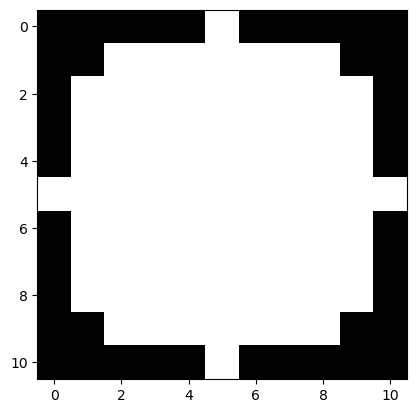

In [2]:
if student:
    strell = morpho.disk(5)

print(strell)
plt.imshow(strell, cmap="gray", vmin=0, vmax=1)
plt.show()


Find a way to create a vertical line as a structuring element with parameter length l :

[[1]
 [1]
 [1]
 [1]
 [1]]


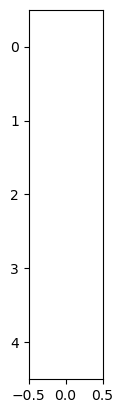

In [3]:
def line_strell(l, w = 1):
    if student:
        strell = morpho.rectangle(l, w)
    return strell


strell = line_strell(5)
print(strell)
plt.imshow(strell, cmap="gray", vmin=0, vmax=1)
plt.show()


### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

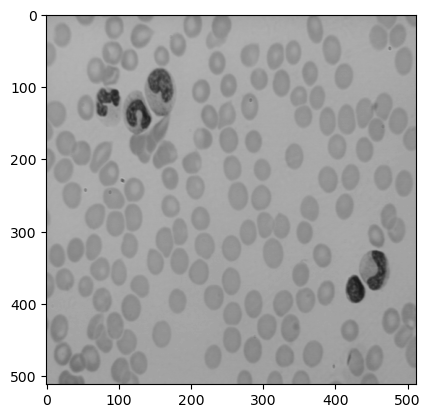

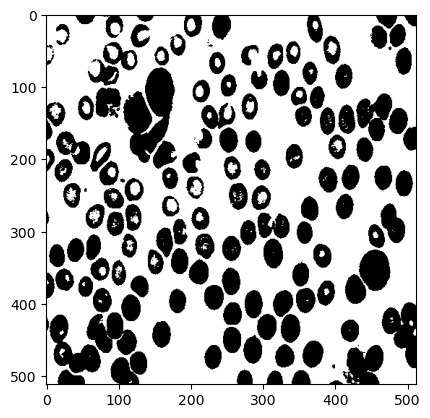

In [4]:
# load the cell image in grayscale and display it
if student:
    img = skio.imread("images/cell.tif")
    binary = img > 150
    plt.imshow(img, cmap="gray", vmin=0, vmax=255)
    plt.show()
    plt.imshow(binary, cmap="gray", vmin=0, vmax=1)
    plt.show()


We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

In [5]:
def morpho_operations(binary, strell):
    fig, ax = plt.subplots(2, 2, figsize=(20, 20))
    ax = ax.reshape(-1)
    imgs = [
        morpho.binary_erosion(binary, strell),
        morpho.binary_dilation(binary, strell),
        morpho.binary_opening(binary, strell),
        morpho.binary_closing(binary, strell),
    ]

    names = ["erosion", "dilation", "opening", "closing"]

    for i in range(4):
        ax[i].set_title(names[i])
        ax[i].imshow(imgs[i], cmap="gray", vmin=0, vmax=1)

    plt.show()


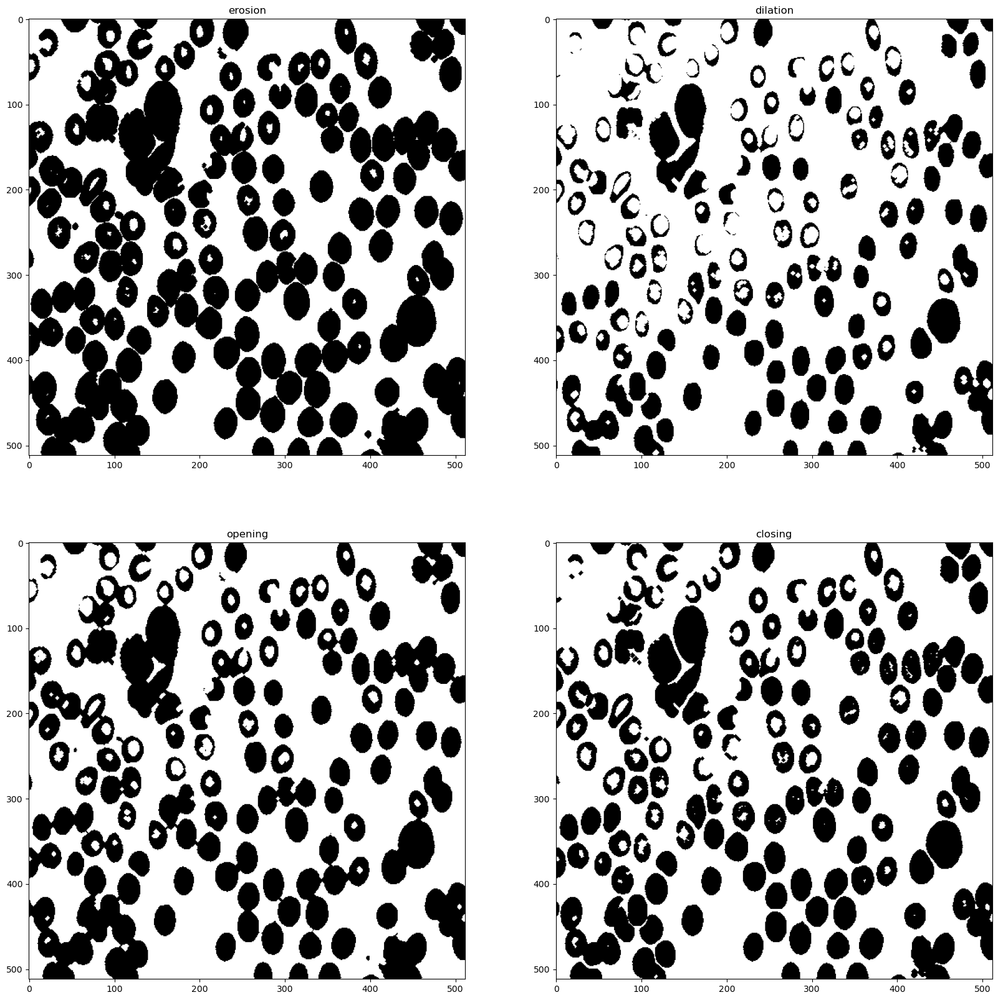

In [6]:
if student:
  strell = morpho.disk(2)
  morpho_operations(binary, strell)


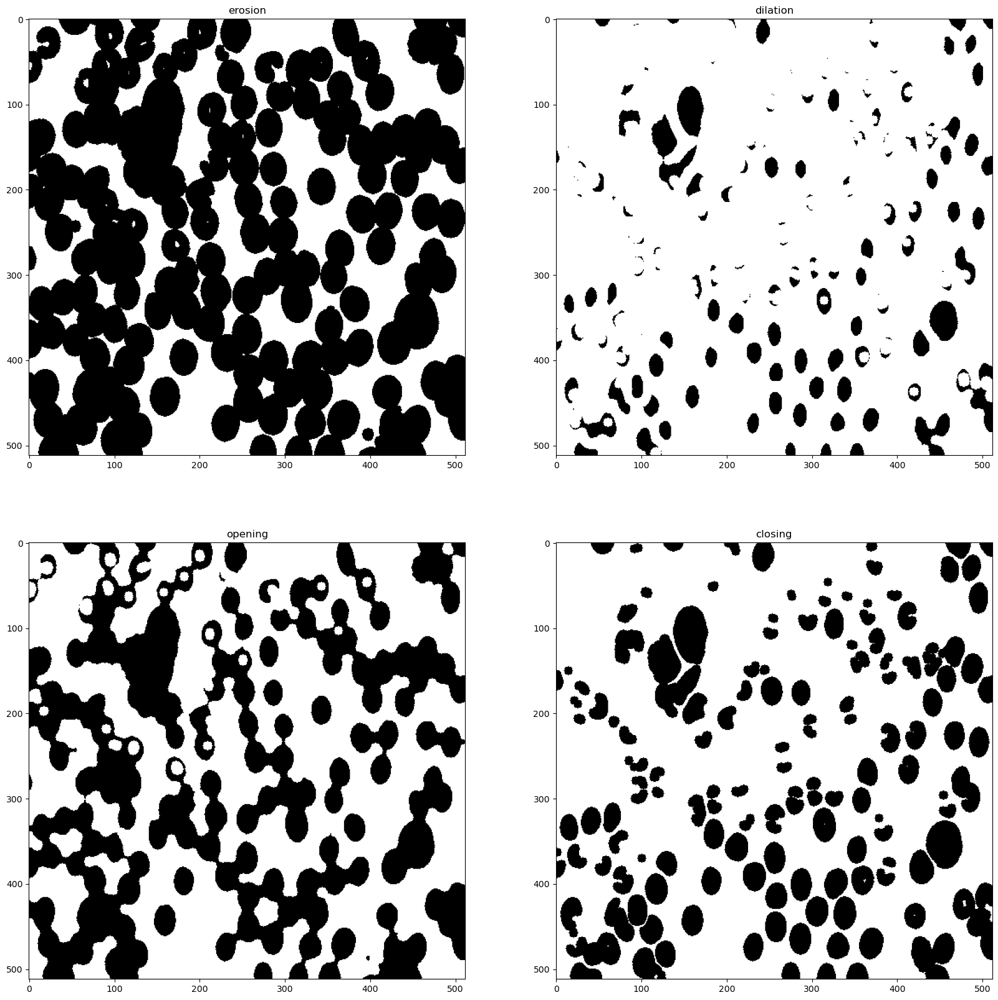

In [7]:
if student:
  strell = morpho.disk(5)
  morpho_operations(binary, strell)


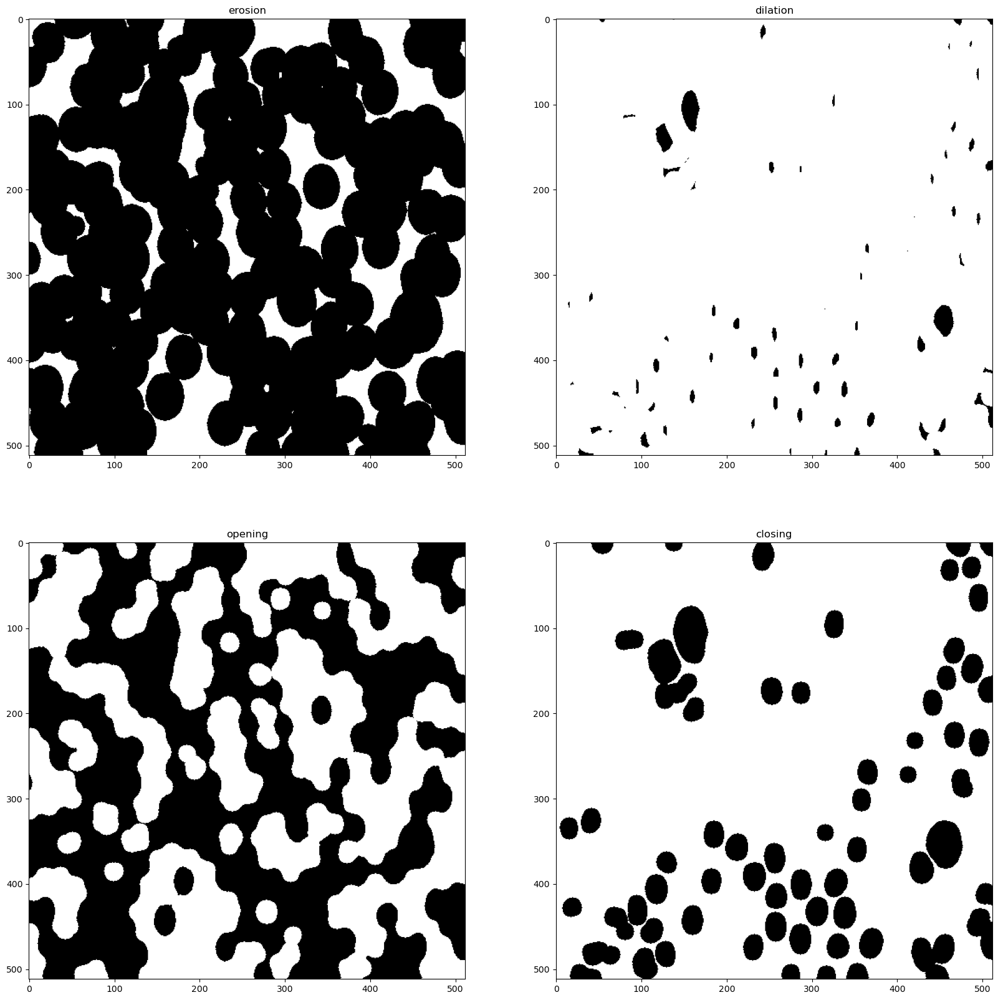

In [8]:
if student:
  strell = morpho.disk(10)
  morpho_operations(binary, strell)


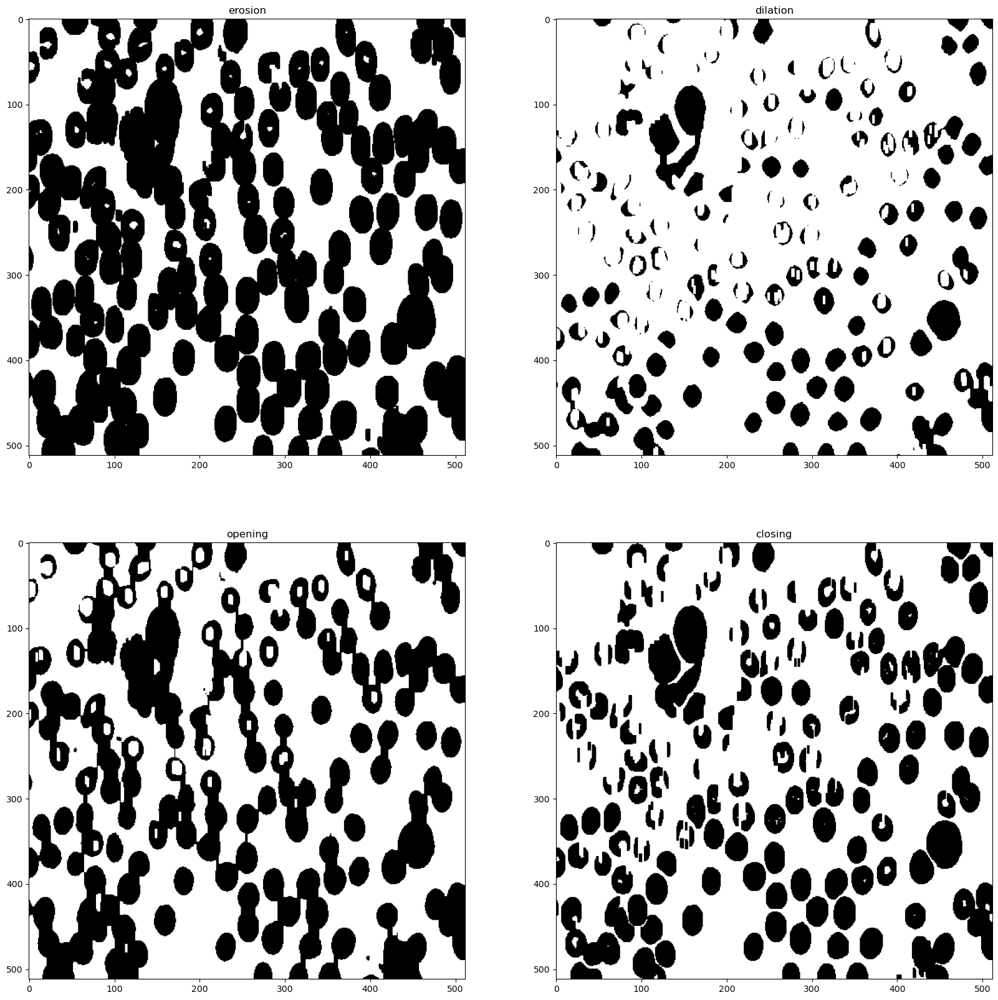

In [9]:
if student:
    strell = line_strell(10, 3)
    morpho_operations(binary, strell)


- **Q** : What is the influence of the shape of the structuring element ?

  - **A** : The shape of the structuring element influences the prioritized aspect of the operations of erosion and/or dilation. With a circle as the structuring element: the opening operation merges object in any direction, and the closing algorithm attempts to fit circles into the black objects. With a vertical line as the structuring element: the opening operation merges object in the vertical direction, and the closing algorithm attempts to fit lines into the black objects. 

- **Q** : What is the influence of the size of the structuring element ?

  - **A** : For the closing operation the size acts as a threshold: the remaining structures after closing are those that resemble the structuring element with size comparable or greater to that of the shape of the structuring element. For the opening operation the size measures the degree of merging: merged objects are those with a distance in between comparable or smaller to that of the shape of the structuring element.

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


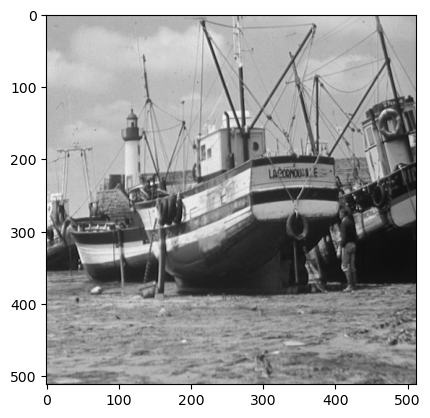

In [10]:
# load the bateau image in grayscale and display it
if student:
    img = skio.imread("images/bateau.tif")
    plt.imshow(img, cmap="gray", vmin=0, vmax=255)
    plt.show()


Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

In [11]:
def greyscale_morpho_operations(binary, strell):
    fig, ax = plt.subplots(2, 2, figsize=(20, 20))
    ax = ax.reshape(-1)
    imgs = [
        morpho.erosion(binary, strell),
        morpho.dilation(binary, strell),
        morpho.opening(binary, strell),
        morpho.closing(binary, strell),
    ]

    names = ["erosion", "dilation", "opening", "closing"]

    for i in range(4):
        ax[i].set_title(names[i])
        ax[i].imshow(imgs[i], cmap="gray", vmin=0, vmax=255)

    plt.show()


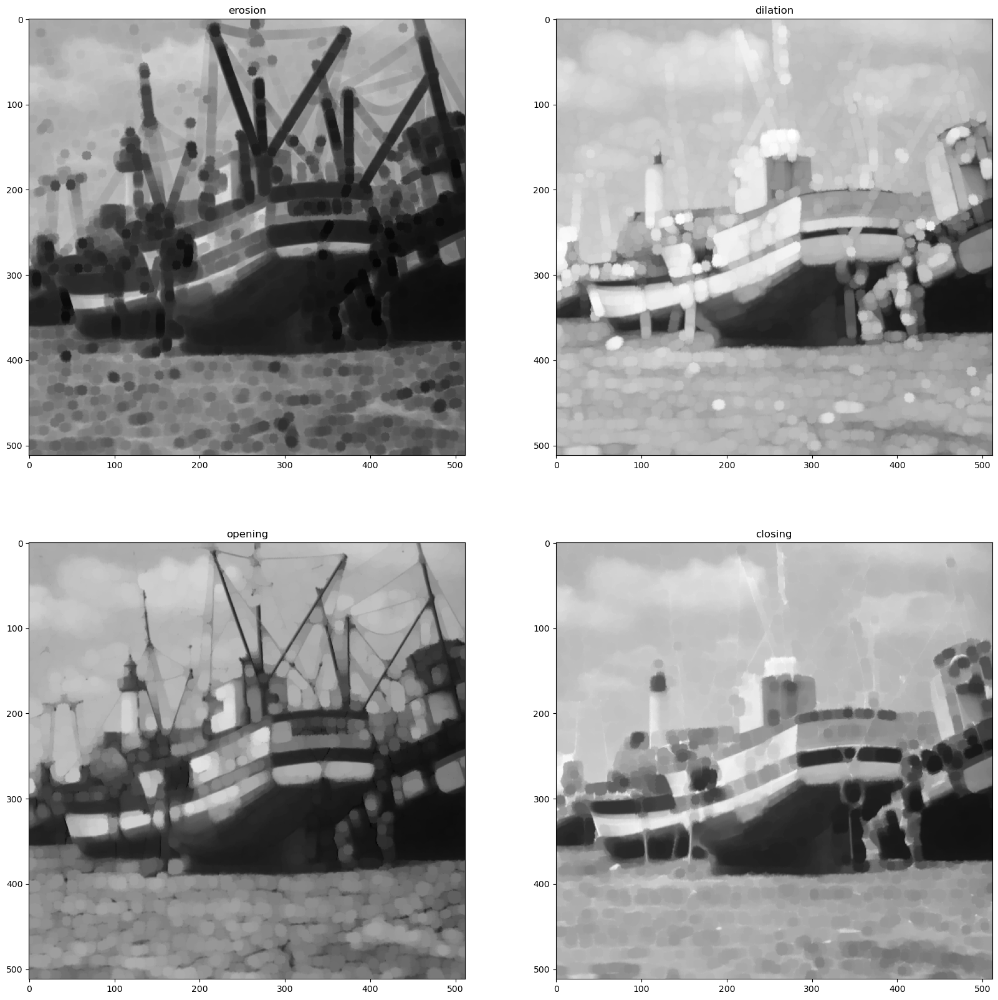

In [12]:
if student:
    strell = morpho.disk(5)
    greyscale_morpho_operations(img, strell)


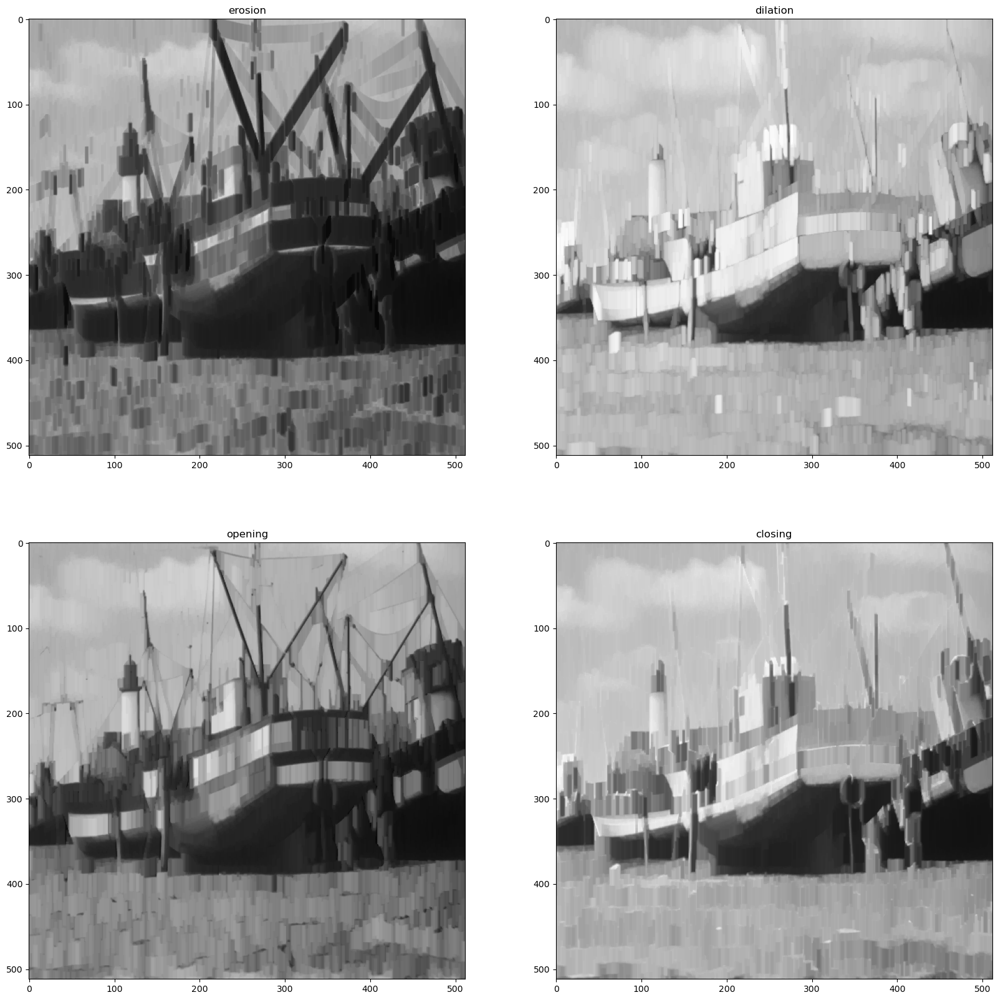

In [13]:
if student:
    strell = line_strell(20, 3)
    greyscale_morpho_operations(img, strell)


- **Q** : What is the influence of the shape and size parameters of the structuring element ?

  - **A** :
    - For the erosion operation, the dark regions are enlarged according to the structuring element's shape and size, and small light regions are suppressed. For the closing operation, the light regions are enlarged according to the structuring element's shape and size, and small dark regions are suppressed.
    - For the opening operation the size of the objects is generally preserved, but small peak like variations are suppressed. For the closing operation the size of the objects is generally preserved, but small valley like variations are suppressed.
      - Furthermore, the shape of the structuring element determines the direction in which those variations are suppressed: when using a circle, the suppression is isotropic; when using a vertical segment, variations are suppressed in the vertical direction. In addition, the greater the size of the structuring element, the blurrier the image becomes.

- **Q** : We then now try to illustrate the iterativity property. What is the
result of a dilation by a disk structuring element of size 2 followed by a dilation by a disk structuring element of size 3? Compare it with a dilation by a disk of size 5. Explain.

  - **A** : The iteration property of dilation if formally stated as:
    $$D\left( D(X, B), B'\right) = D\left( X, B \oplus B'\right)$$
    Therefore, dilation by a structuring element of size 2 followed by a dilation by an element of same shape but size 3 corresponds to dilating the image by a structuring element that is the dilation of one of the original structuring elements by the other.

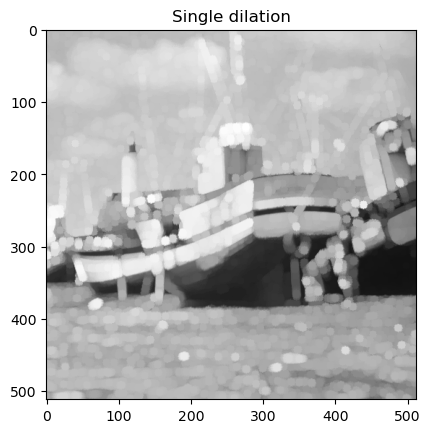

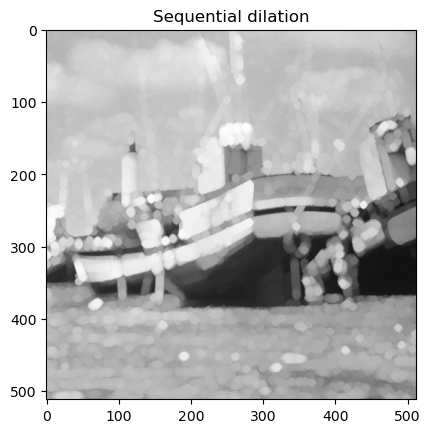

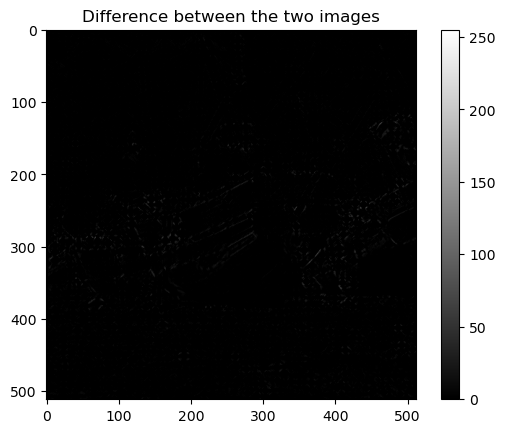

195761
0


In [14]:
if student:
    dilation = morpho.dilation(img, morpho.disk(5))
    plt.imshow(dilation, cmap="gray", vmin=0, vmax=255)
    plt.title("Single dilation")
    plt.show()

    sequential_dilation = morpho.dilation(
        morpho.dilation(img, morpho.disk(2)), morpho.disk(3)
    )
    plt.imshow(sequential_dilation, cmap="gray", vmin=0, vmax=255)
    plt.title("Sequential dilation")
    plt.show()

    plt.imshow(dilation - sequential_dilation, cmap="gray", vmin=0, vmax=255)
    plt.title("Difference between the two images")
    plt.colorbar()
    plt.show()

    print(np.sum(np.abs(dilation - sequential_dilation)))

    eq_dilation = morpho.dilation(
        img, morpho.dilation(np.pad(morpho.disk(2), 3), morpho.disk(3))
    )

    print(np.sum(abs(eq_dilation - sequential_dilation)))


- **Q:** Plot the result of dilation by a disk structuring element of size 2 followed by an opening by a disk structuring element of size 3. Compare with a dilation of the image by (a disk of size 2 dilated by a disk of size 3). Please note that you might have to use the np.pad function to perform this. Conclude.

- **A:** As shown in the previous question, they are equivalent.

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


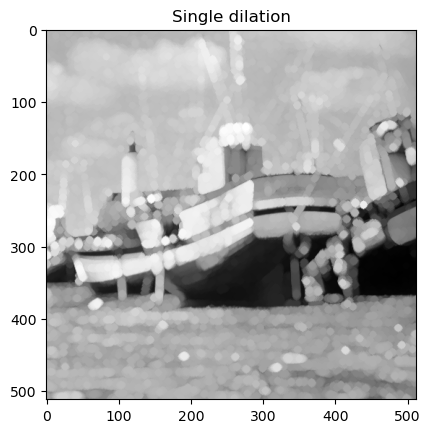

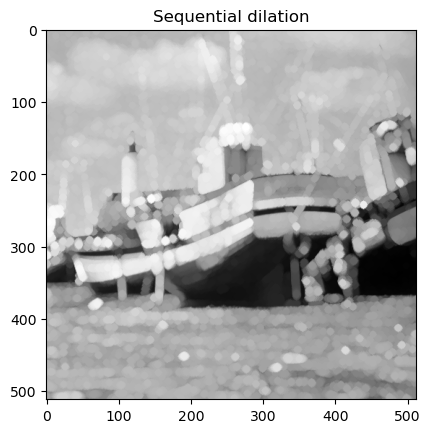

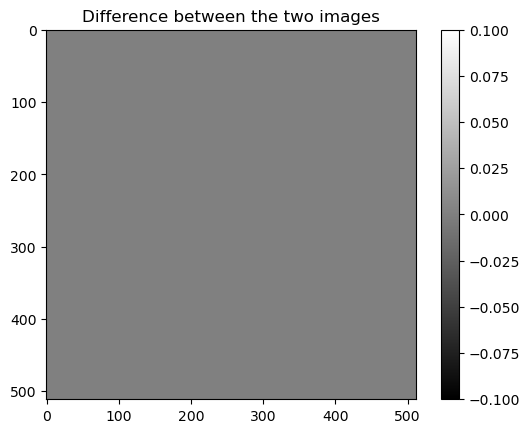

0


In [15]:
if student:
    # First create the sequential structuring element, that is a disk of size 2 dilated by a disk of size 3
    sqr_strell = morpho.disk(2)
    sqr_strell = np.pad(sqr_strell, 3)
    sqr_strell = morpho.dilation(sqr_strell, morpho.disk(3))
    print(sqr_strell)

    # Use it to perform the image dilation
    dilation = morpho.dilation(img, sqr_strell)
    plt.imshow(dilation, cmap="gray")
    plt.title("Single dilation")
    plt.show()

    # Compare it with the sequential dilation
    sequential_dilation = morpho.dilation(
        morpho.dilation(img, morpho.disk(2)), morpho.disk(3)
    )
    plt.imshow(sequential_dilation, cmap="gray")
    plt.title("Sequential dilation")
    plt.show()

    plt.imshow(dilation - sequential_dilation, cmap="gray")
    plt.title("Difference between the two images")
    plt.colorbar()
    plt.show()
    print(np.sum(np.abs(dilation - sequential_dilation)))


- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.

  - **A:** Idempotence if formally defined as:
    $$\left( X^B \right)^B = X^B$$
    Meaning that once the closing operation is applied, further applications of the operation do not change the results, as illustrated bellow:

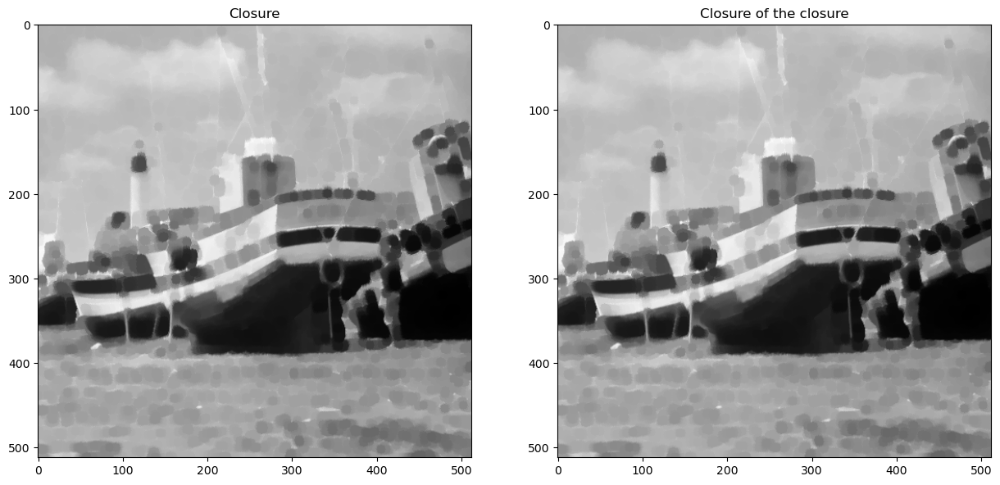

0


In [16]:
if student:
    strell = morpho.disk(5)

    fig, ax = plt.subplots(1, 2, figsize=(15, 8))
    ax = ax.reshape(-1)

    # closing operation
    imgB = morpho.closing(img, strell)

    # two successive closing operations
    imgBB = morpho.closing(imgB, strell)

    imgs = [imgB, imgBB]

    names = ["Closure", "Closure of the closure"]

    for i in range(2):
        ax[i].set_title(names[i])
        ax[i].imshow(imgs[i], cmap="gray")
    plt.show()

    print(np.sum(np.abs(imgB - imgBB)))


- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening). Comment the result depending on the choice of the structuring element.

  - **A** : The top-hat transformation allows the detection of objects that are smaller then the structuring element (in which the structuring element cannot be fit) and that are brighter than their surroundings. For example, when using a circle as the structuring element, small bright elements are detected no matter their orientation. However, when using vertical segments, we detect mainly bright horizontal artefacts and, when using horizontal segments, bright vertical structures are detected.

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image). Comment the result depending on the choice of the structuring element.

  - **A** : The dual top-hat transformation allows the detection of objects that are smaller then the structuring element (in which the structuring element cannot be fit) and that are darker than their surroundings. For example, when using a circle as the structuring element, small dark elements are detected no matter their orientation. However, when using vertical segments, we detect mainly dark horizontal artefacts and, when using horizontal segments, dark vertical structures are detected.

In [17]:
def top_hat(img, strell):
    th = img - morpho.opening(img, strell)
    dth = morpho.closing(img, strell) - img

    fig, ax = plt.subplots(1, 3, figsize=(20, 7))
    ax = ax.reshape(-1)

    imgs = [img, th, dth]
    names = ["Original image", "Top-hat", "Dual top-hat"]
    for i in range(3):
        ax[i].set_title(names[i])
        ax[i].imshow(imgs[i], cmap="gray")
    plt.show()


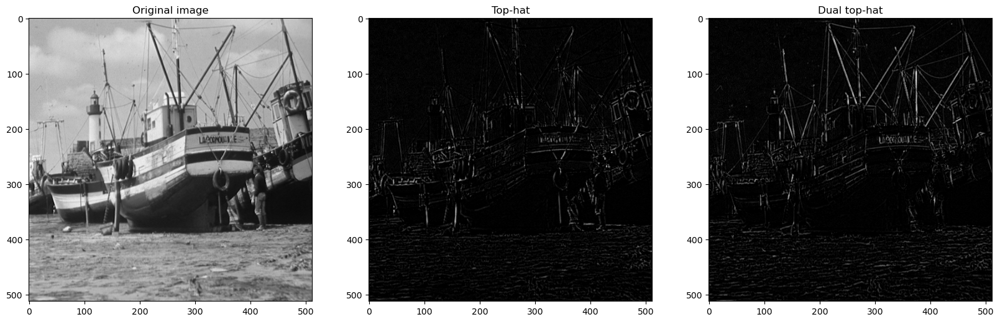

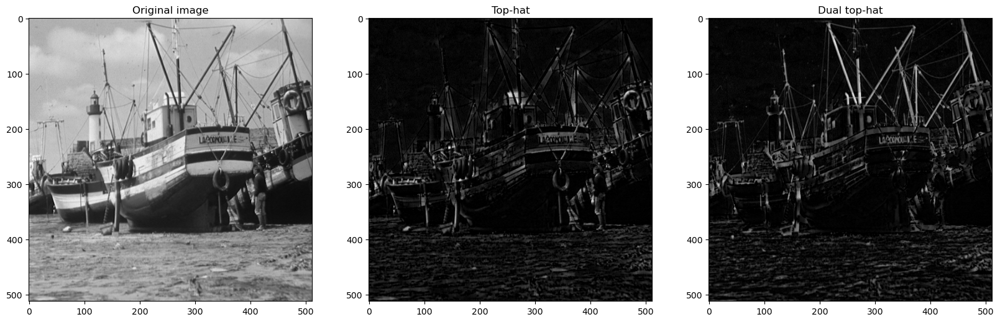

In [18]:
if student:
    strell = morpho.disk(2)
    top_hat(img, strell)

    strell = morpho.disk(5)
    top_hat(img, strell)


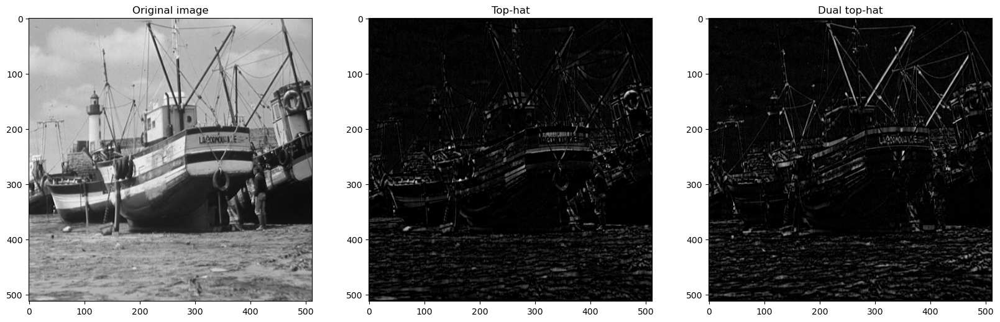

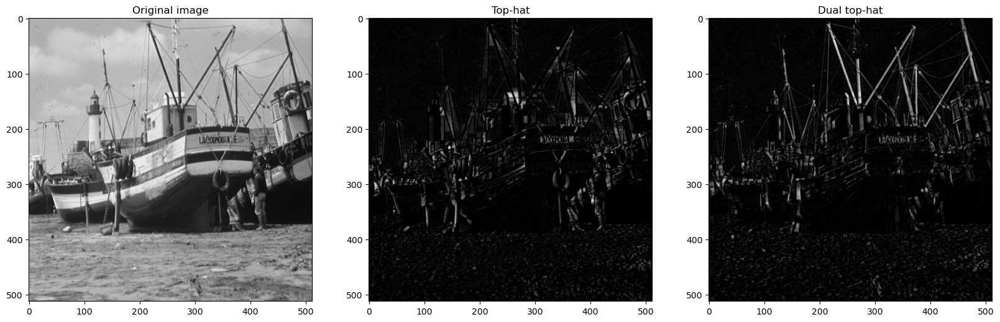

In [19]:
if student:
    strell = line_strell(10, 2)
    top_hat(img, strell)

    strell = line_strell(2, 10)
    top_hat(img, strell)


### Alternating Filters

- **Q**: Perform alternate sequential filters, for instance by performing sequential opening and then closing by squares of radius ranging from 1 to 5. Also try out your own combinations. What kind of filtering can be expected from such operations?

  - **A**: The filtering operation that can be expected from alternate sequential filters is noise cancellation and smoothing, as can be observed in the cells bellow. The smallest variation that can be observed after successive opening and closing operations is of the shape and size of the structuring element.

In [20]:
def alternating_filters(img, strell_gen, size_list):
    r = int(np.ceil((len(size_list) + 1) / 3))
    fig, ax = plt.subplots(r, 3, figsize=(20, r * 6))
    ax = ax.reshape(-1)

    imgf = img.copy()
    for i in range(len(size_list)):
        se = strell_gen(size_list[i])
        imgf = morpho.closing(morpho.opening(imgf, se), se)
        ax[i].imshow(imgf, cmap="gray")

    ax[len(size_list)].imshow(img, cmap="gray")

    for a in ax:
        a.axis("off")

    plt.show()


In [21]:
img = skio.imread("images/montreuil.tif")


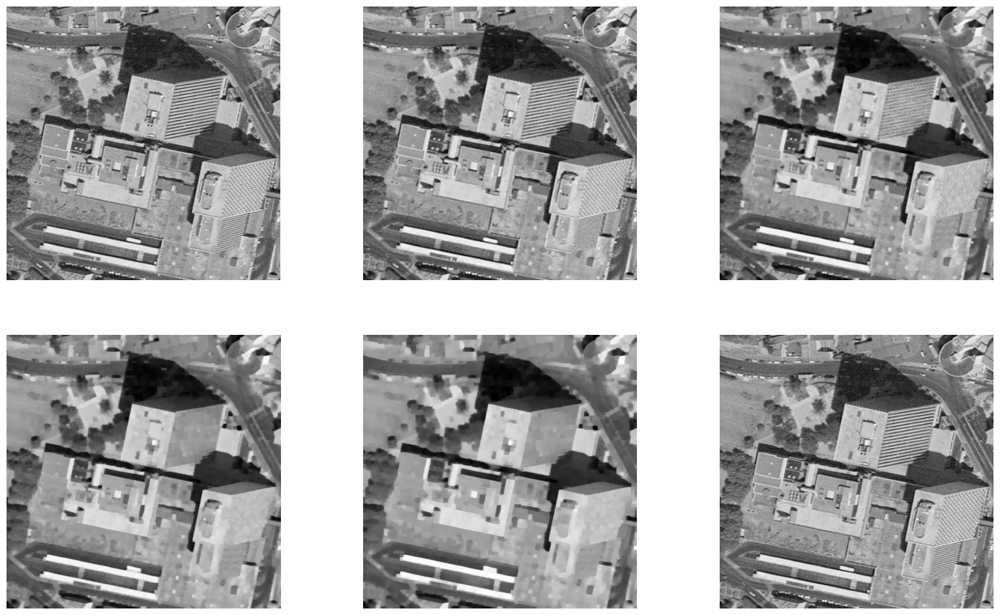

In [22]:
if student:
    alternating_filters(img, morpho.square, [1, 2, 3, 4, 5])


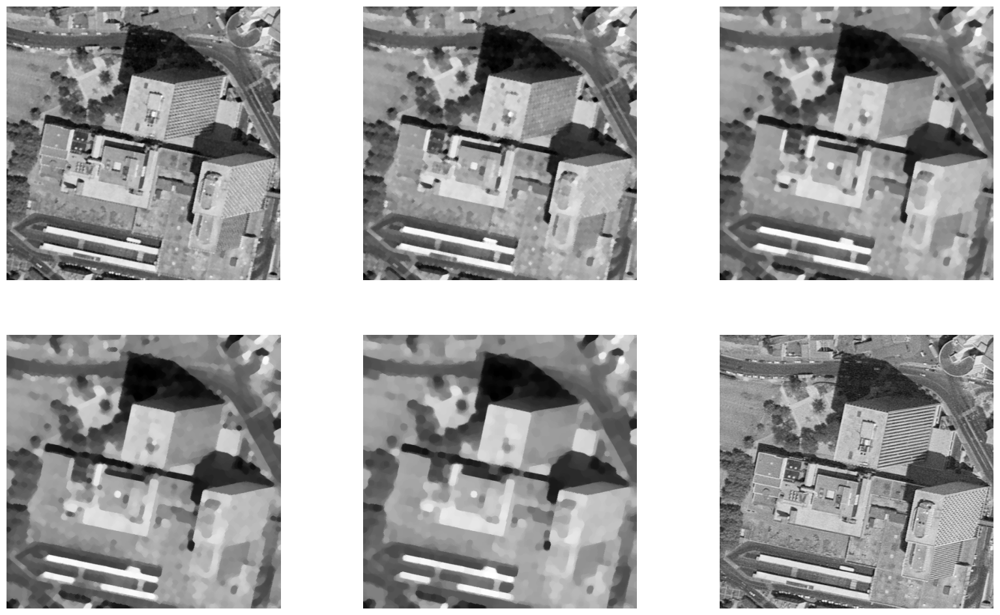

In [23]:
if student:
    alternating_filters(img, morpho.disk, [1, 2, 3, 4, 5])


### Segmentation

- **Q** : Apply a morphological gradient to the image cell.tif (difference between dilation and erosion with a structuring element of radius 1). What do you observe ?

  - **A**: Applying the morphological gradient to the image we obtain results that are similar to those obtained by the computation of the gradient of the images. Dilation increases light regions and reduces dark ones, on the other hand, erosion increases dark regions and reduces light ones, therefore, by computing the difference between the two operations, we obtain the contours of the objects. The thickness of the contours depend on the size of the structuring element: the larger the element, the thicker the contour. Also, increasing the structuring element size, we observe less noise and false contours.

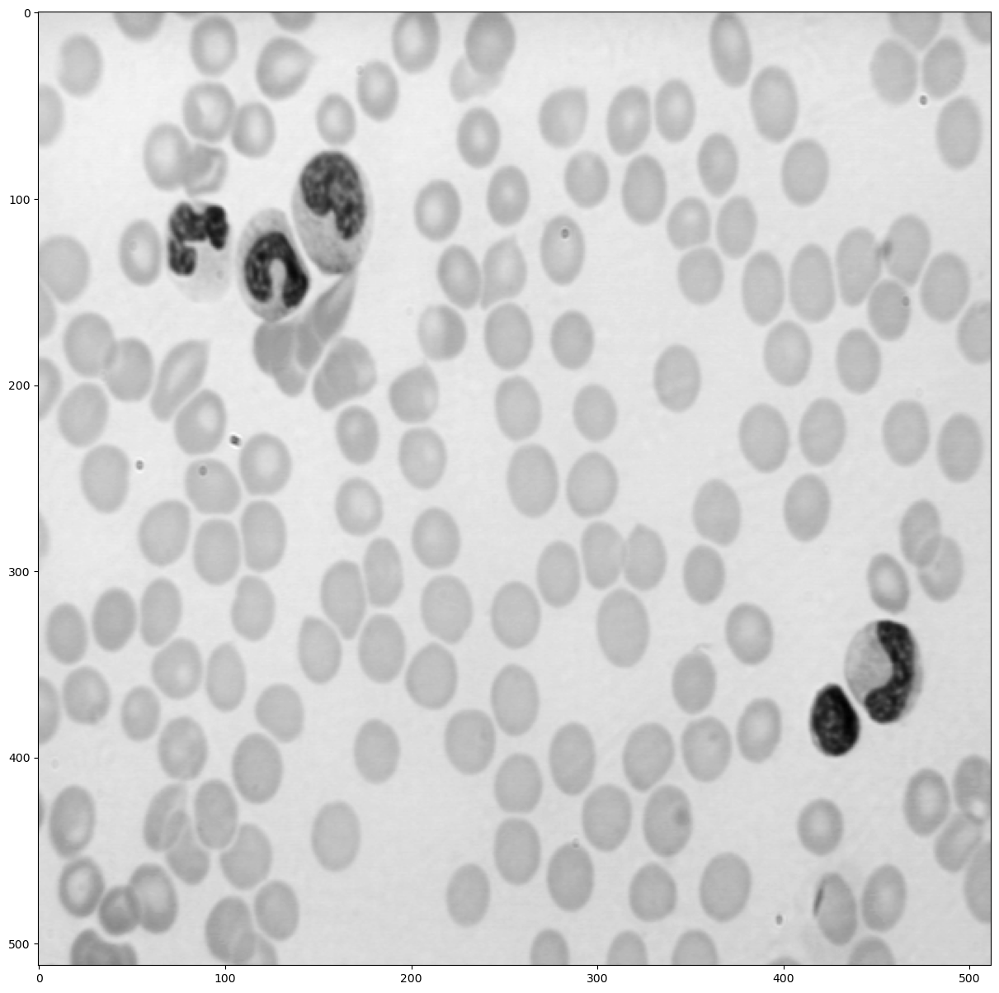

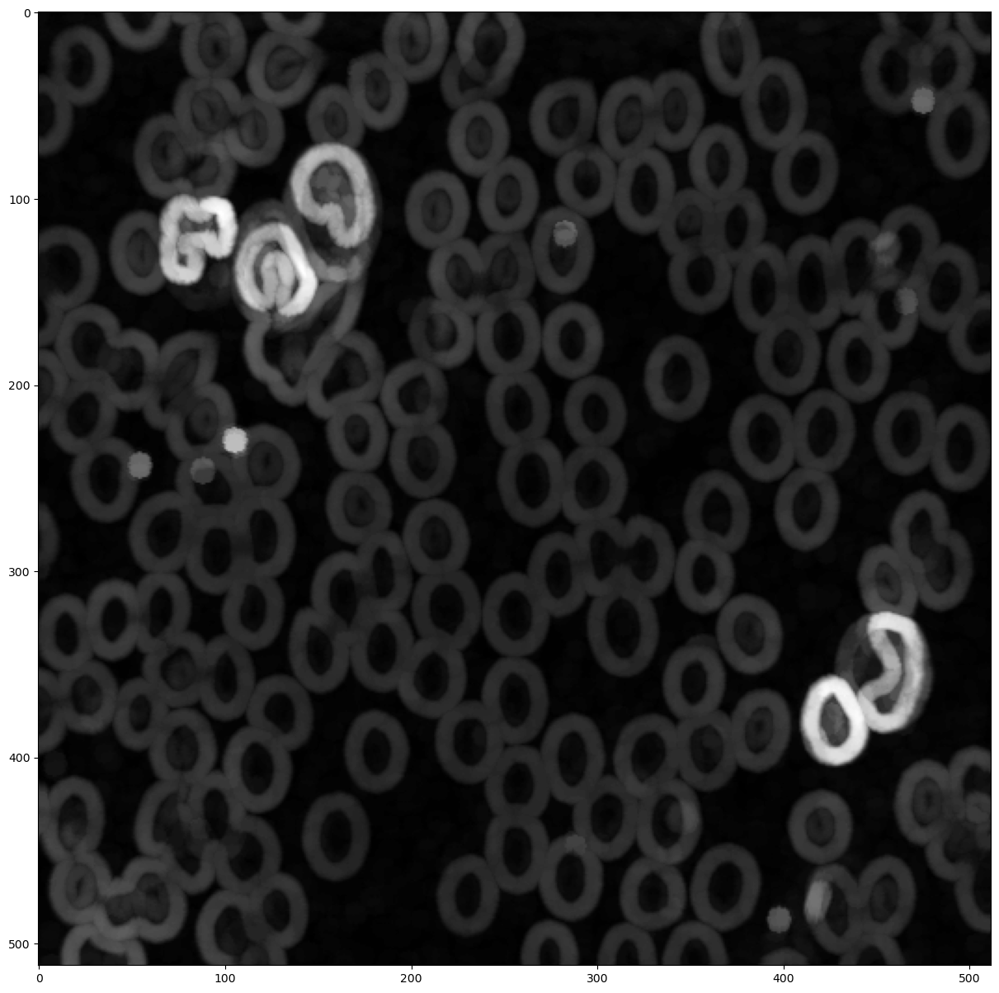

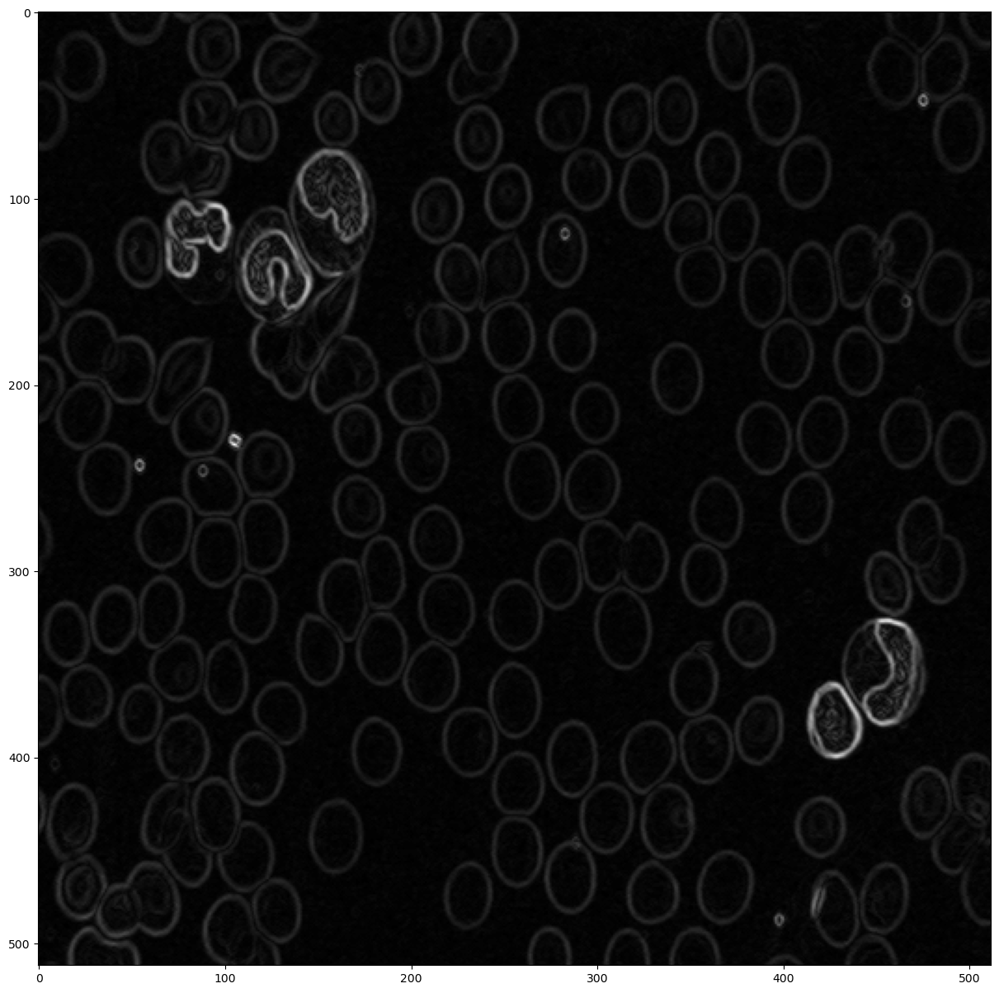

In [24]:
img = skio.imread("images/cell.tif")
plt.figure(figsize=(15, 15))
plt.imshow(img, cmap="gray")
plt.show()

if student:
    strell = morpho.disk(5)
    morpho_grad = morpho.dilation(img, strell) - morpho.erosion(img, strell)

    plt.figure(figsize=(15, 15))
    plt.imshow(morpho_grad, cmap="gray")
    plt.show()

if student:
    strell = morpho.disk(1)
    morpho_grad = morpho.dilation(img, strell) - morpho.erosion(img, strell)

    plt.figure(figsize=(15, 15))
    plt.imshow(morpho_grad, cmap="gray")
    plt.show()



- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?

  - **A** : It is difficult to find the appropriate threshold value because as we increase it, parasite structures are suppressed, but true contours between zones whose grey levels are close also disappear, therefore those two aspects have to be balanced.

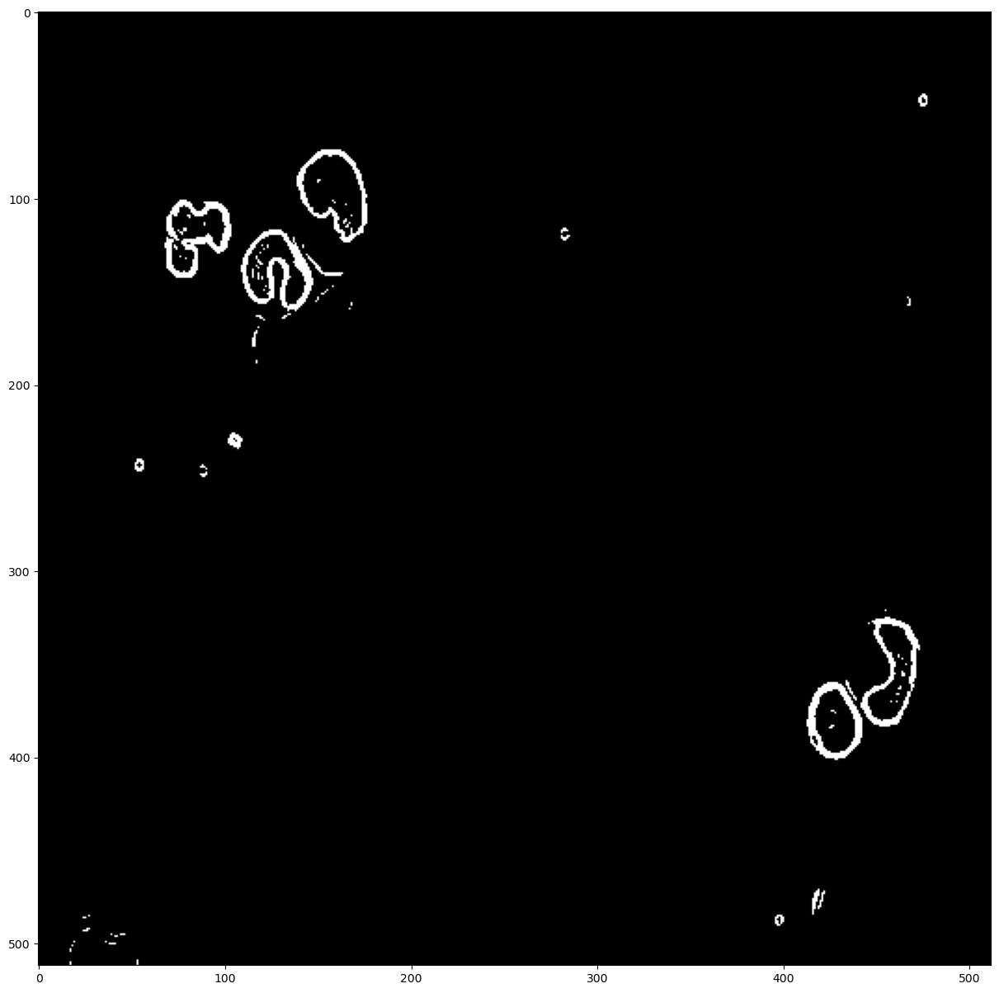

In [25]:
if student:
    thresh_grad = morpho_grad > 25
    plt.figure(figsize=(15, 15))
    plt.imshow(thresh_grad, cmap="gray")
    plt.show()


- **Q** Apply the watershed algorithm to the gradient image using `seg.watershed(morpho_grad,k)`; What do you observe?

  - **A**: In the following cell, the segmented regions were superimposed over the gradient image. We see that the watershed algorithm successfully segments some cells, however, others are merged into a single region.

- **Q** Try to change the parameter k; what is the role of that parameter ?

  - **A**: The parameter k determines the number of different regions that are detected.

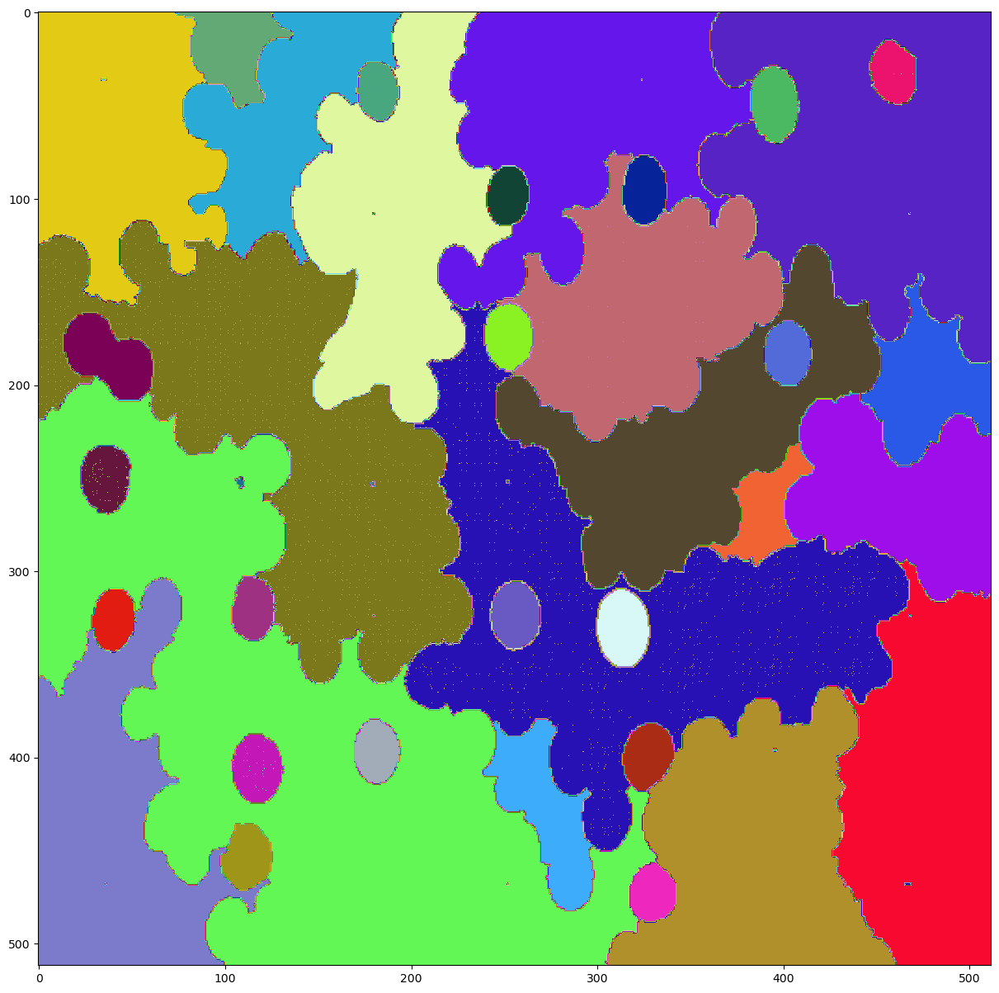

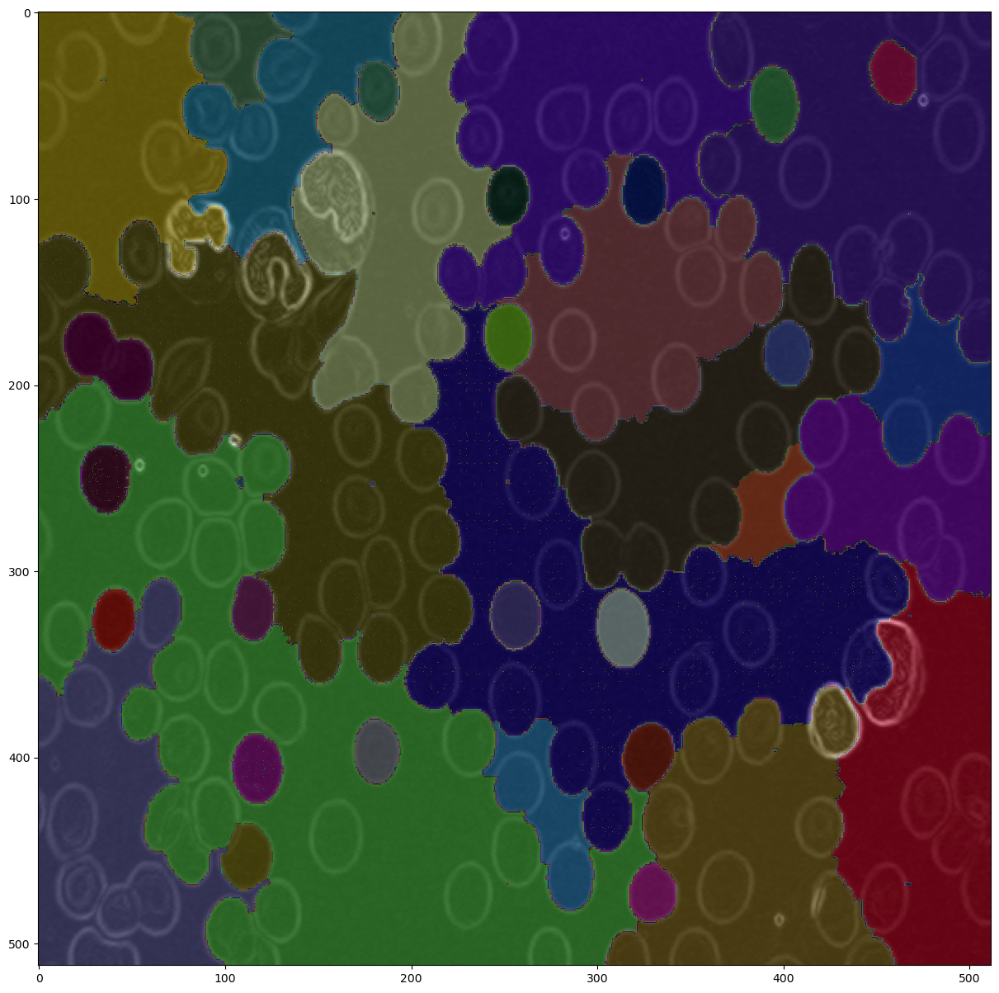

In [26]:
import matplotlib

cmaprand = matplotlib.colors.ListedColormap(np.random.rand(256, 3))

if student:
    k = 50
    wat = seg.watershed(morpho_grad, k)

    plt.figure(figsize=(15, 15))
    plt.imshow(wat, cmap=cmaprand)
    plt.show()

    plt.figure(figsize=(15, 15))
    plt.imshow(morpho_grad, cmap="gray")
    plt.imshow(wat, cmap=cmaprand, alpha=0.4)
    plt.show()



- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?

  - **A** : When applying a closing on the gradient image, small dark regions are suppressed, as such the contours became more continuous and some microstructures and noise were smoothed out. However the result of the watershed algorithm wasn't improved, this might be explained by the smoothing out of internal structures in the interior of the cells, which became lighter, so their contours aren't as defined.


- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 

  - **A** : When applying an opening, we have the suppression of small light regions, as such the contours of the cells were degraded and the result of the watershed algorithm was worse

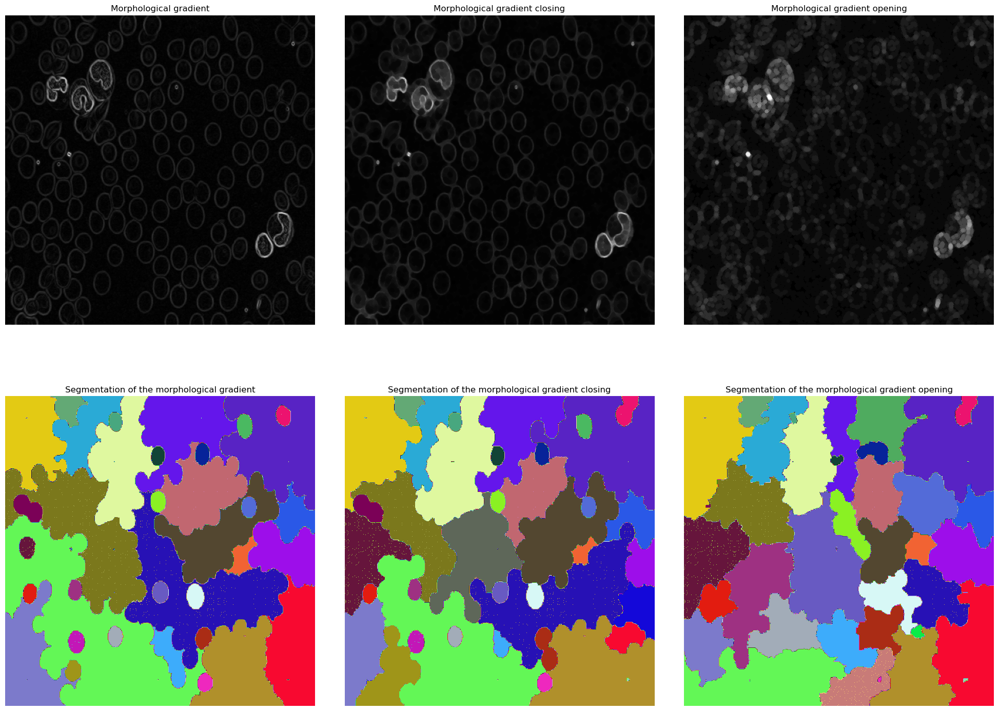

In [27]:
if student:
    se = morpho.disk(3)
    morpho_grad_closing = morpho.closing(morpho_grad, se)
    morpho_grad_opening = morpho.opening(morpho_grad, se)

    k = 50
    wat_closing = seg.watershed(morpho_grad_closing, k)
    wat_opening = seg.watershed(morpho_grad_opening, k)

    fig, ax = plt.subplots(2, 3, figsize=(20, 15))
    fig.tight_layout()
    ax = ax.reshape(-1)

    ax[0].set_title("Morphological gradient")
    ax[0].imshow(morpho_grad, cmap="gray")

    ax[1].set_title("Morphological gradient closing")
    ax[1].imshow(morpho_grad_closing, cmap="gray")

    ax[2].set_title("Morphological gradient opening")
    ax[2].imshow(morpho_grad_opening, cmap="gray")

    ax[3].set_title("Segmentation of the morphological gradient")
    ax[3].imshow(wat, cmap=cmaprand)

    ax[4].set_title("Segmentation of the morphological gradient closing")
    ax[4].imshow(wat_closing, cmap=cmaprand)

    ax[5].set_title("Segmentation of the morphological gradient opening")
    ax[5].imshow(wat_opening, cmap=cmaprand)

    for a in ax:
        a.axis("off")

    plt.show()


Your objective is to try to do better than what you did with the closure and opening. To do that, we propose to use specific markers for the watershed transform.

- **Q** : In the next cell, compute the reconstruction from an opening of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

  - **A** : When computing the reconstruction from the opening of the gradient, we observe as a result an image which has more information, details and noise than the original morphological gradient image. Therefore it it wouldn't improve the segmentation of the cells.

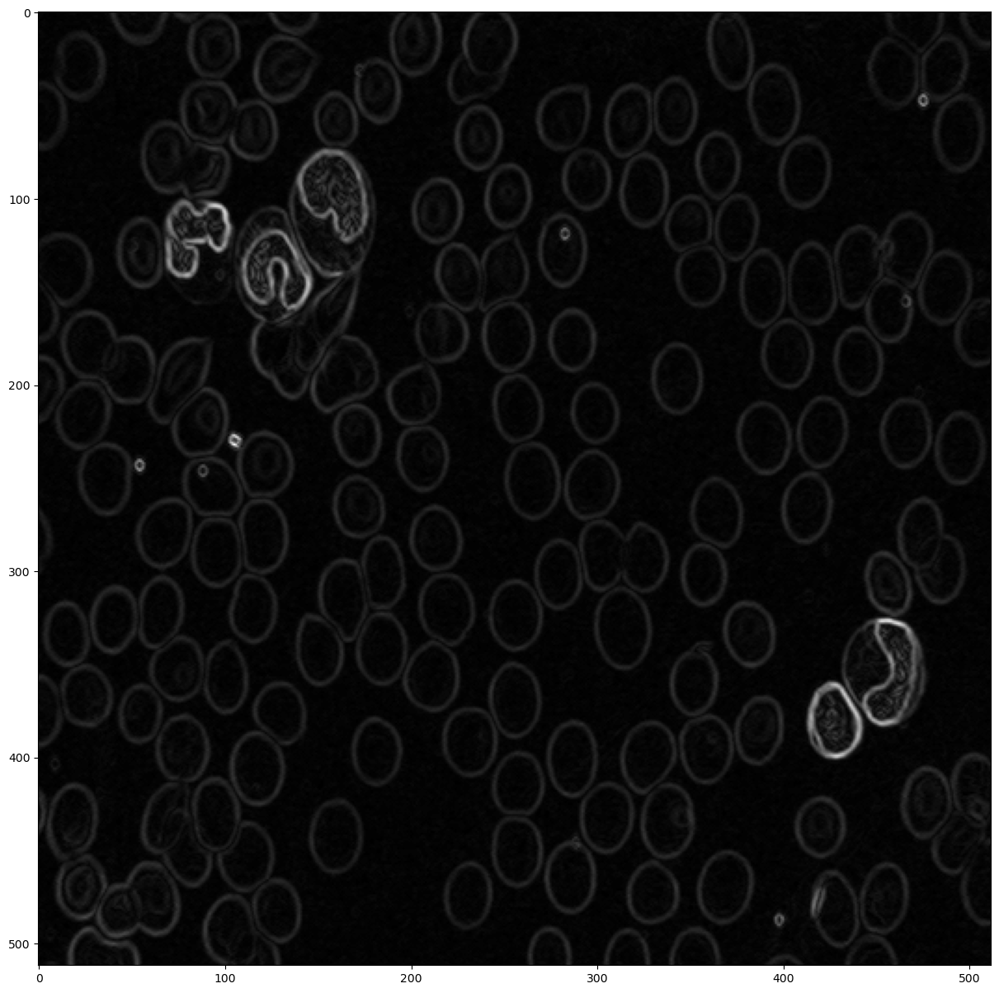

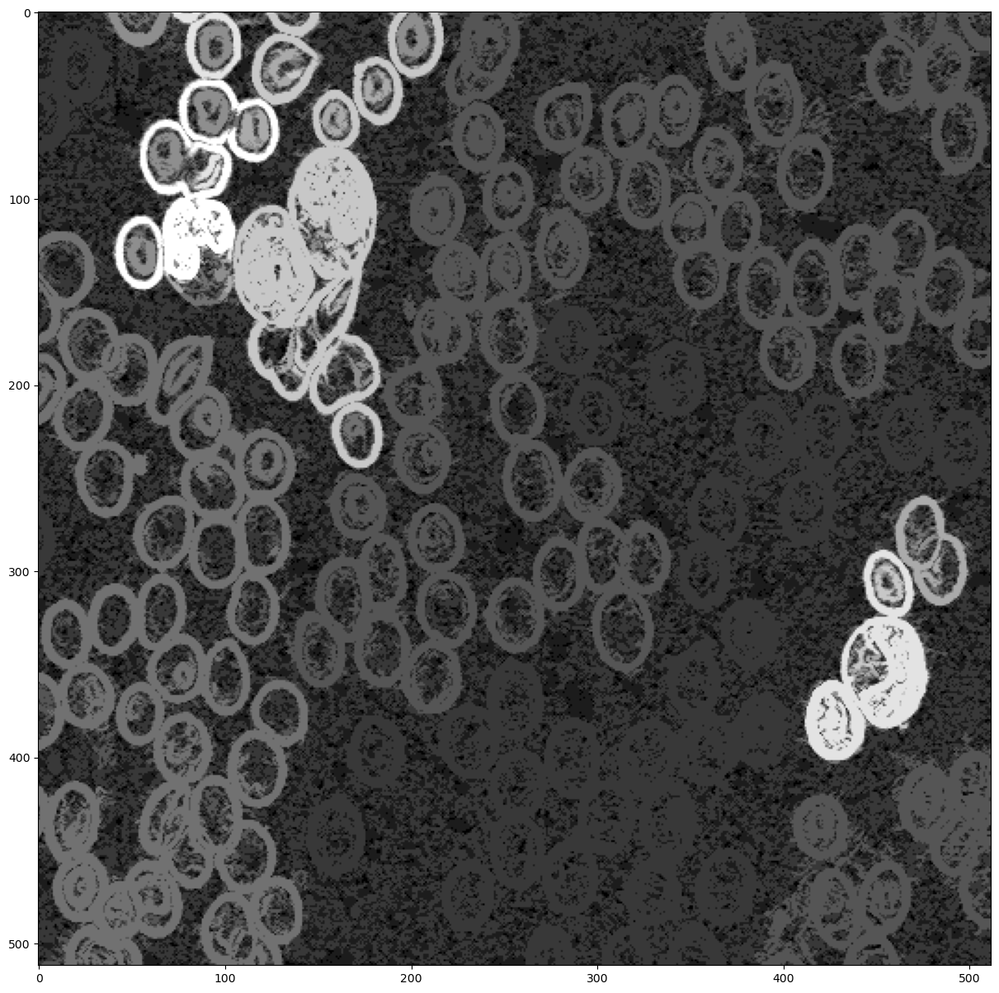

In [28]:
if student:
  imOpen = morpho.opening(morpho_grad, morpho.disk(5))
  recoOpen = morpho.reconstruction(imOpen, morpho_grad)

  plt.figure(figsize=(15, 15))
  plt.imshow(morpho_grad, cmap="gray")
  plt.show()

  plt.figure(figsize=(15, 15))
  plt.imshow(recoOpen, cmap="gray")
  plt.show()


- **Q** : In the next cell, compute the reconstruction from an closing of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

  - **A** : When computing the reconstruction from the closing of the gradient, the result is an image that preserved almost only the contours, therefore it's expected that it would help to efficiently segment the cells.

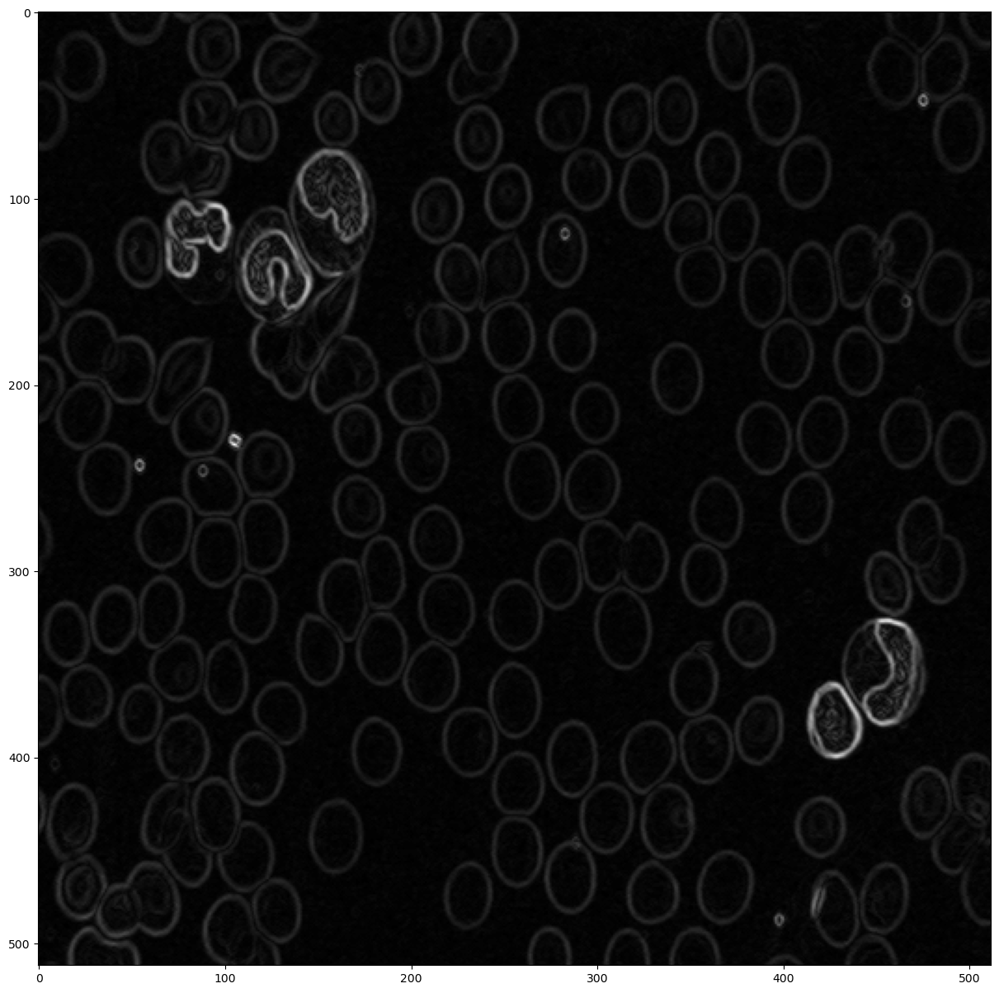

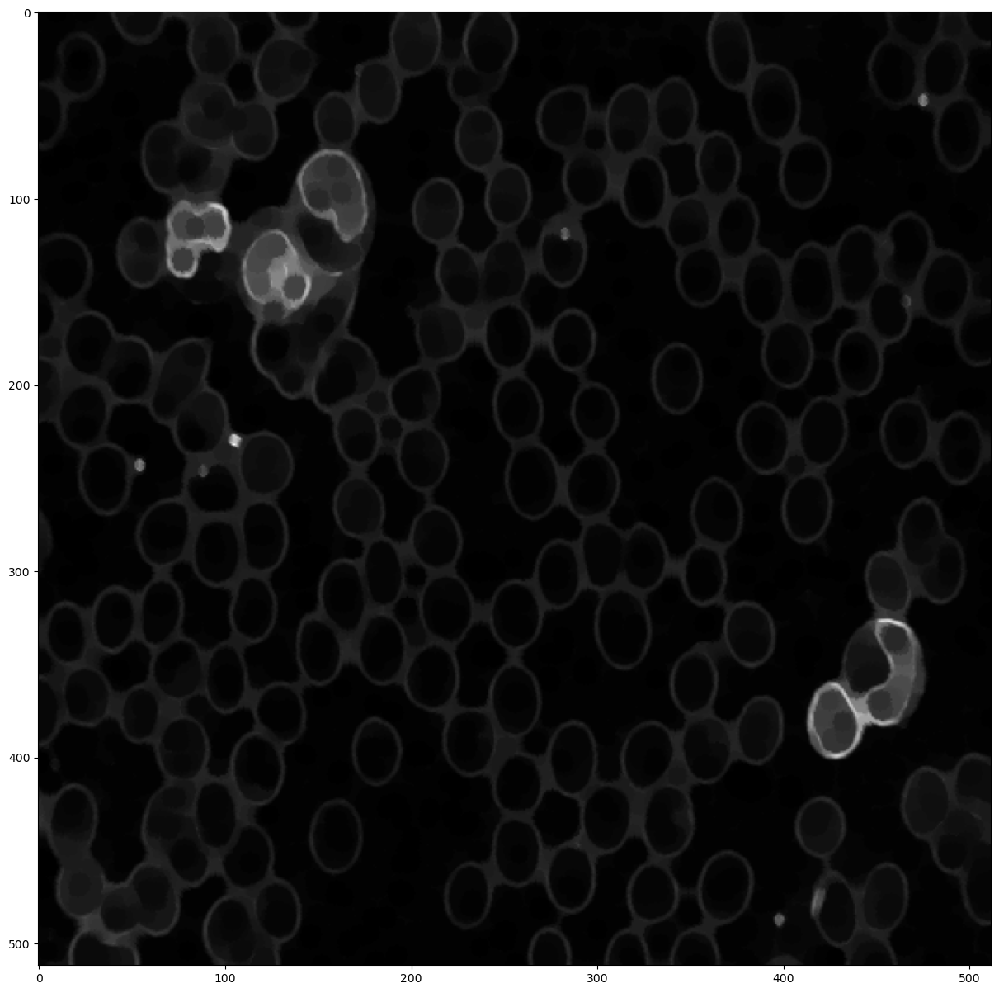

In [29]:
if student:
  imClos = morpho.closing(morpho_grad, morpho.disk(5))
  recoClos = morpho.reconstruction(morpho_grad, imClos)

  plt.figure(figsize=(15, 15))
  plt.imshow(morpho_grad, cmap="gray")
  plt.show()

  plt.figure(figsize=(15, 15))
  plt.imshow(recoClos, cmap="gray")
  plt.show()


**Q** : This last part is less guided. Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

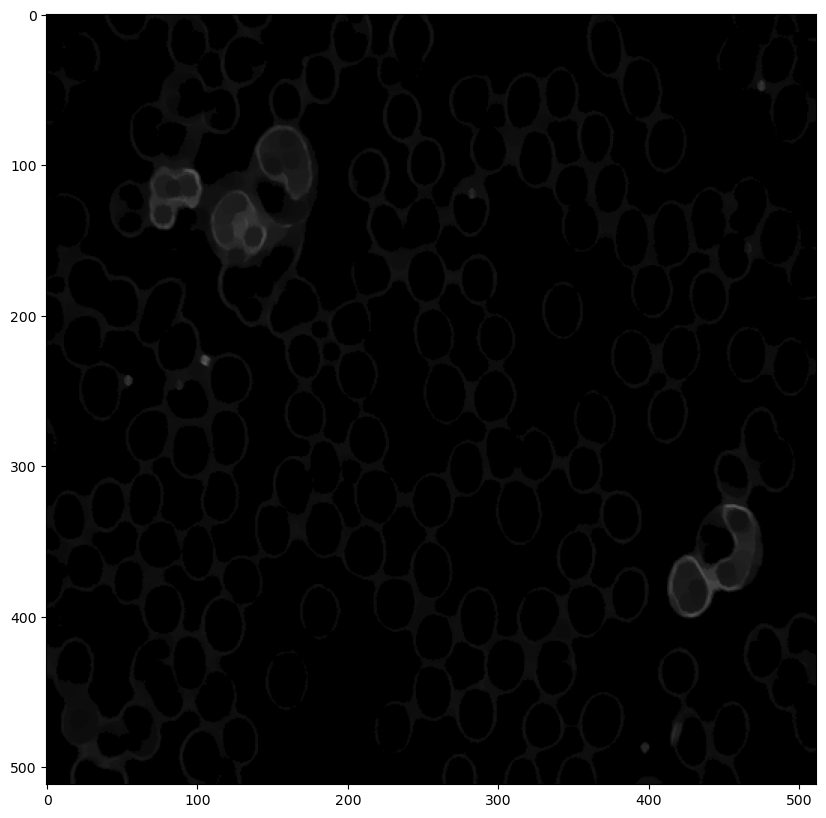

In [30]:
recoClosClean = recoClos * (recoClos > 10)

plt.figure(figsize=(10, 10))
plt.imshow(recoClosClean, cmap="gray", vmin=0, vmax=255)
plt.show()


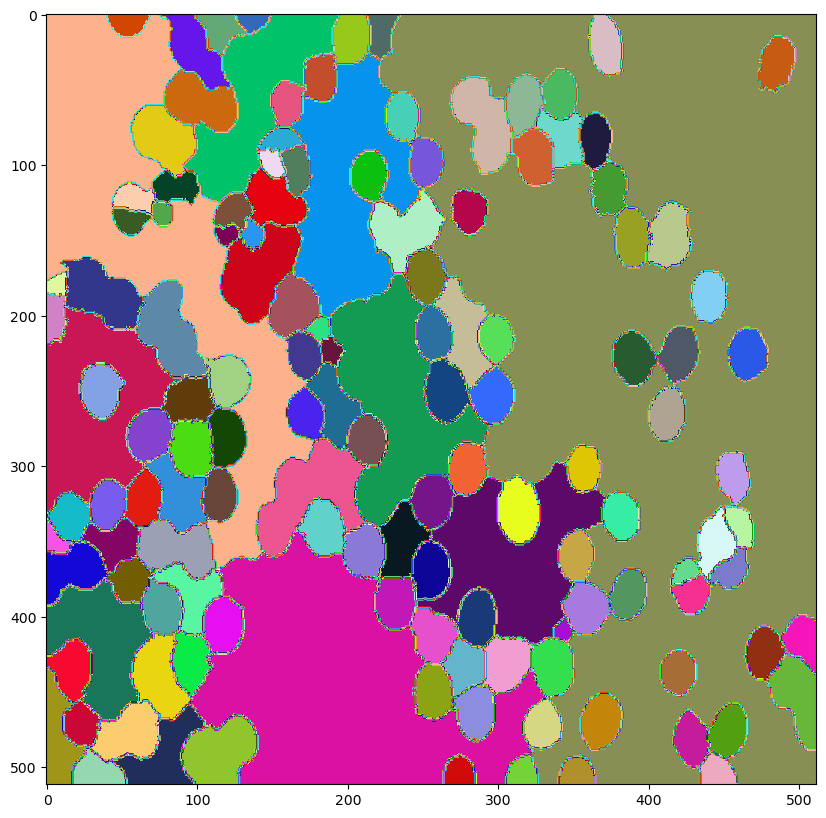

In [31]:
wat_markers = seg.watershed(recoClosClean, watershed_line=True)

plt.figure(figsize=(10, 10))
plt.imshow(wat_markers, cmap=cmaprand)
plt.show()
